# Домашнее задание по теме "Компьютерное зрение"

In [ ]:
%pip install ultralytics

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
%pip install transformers

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
import os
import cv2
import shutil
from ultralytics import YOLO
from ultralytics.utils.ops import xyxy2xywh
from transformers import pipeline
import matplotlib.pyplot as plt
from PIL import ImageDraw, ImageFont
device = 'cuda:0'
yolo_model = YOLO("yolo11m.pt")

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints a

In [ ]:
#results = yolo_model.predict("./hw_week7/dog.jpeg")
#results[0].show()
#results[0].save(filename=f"results.jpg")

In [ ]:
import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

model_id = "IDEA-Research/grounding-dino-base"
device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)



#### Задание 1 (1 балл)
А не обманывает ли вас преподаватель? Перепишите функцию detect_and_draw (или напишите новую), чтобы она возвращала еще и конфиденс для детекции, и убедитесь, что в наличии собаки на картинке сетка уверена больше. Также выберите любую картинку с волком и проверьте то же самое на ней.

In [ ]:
from PIL import ImageDraw, ImageFont

def detect_and_draw(image_path, text, font_size=20):
    image = Image.open(image_path)
    # Check for cats and remote controls
    # VERY important: text queries need to be lowercased + end with a dot
    text = text.lower()

    inputs = processor(images=image, text=text, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)

    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        box_threshold=0.2,
        text_threshold=0.3,
        target_sizes=[image.size[::-1]]
    )
    draw = ImageDraw.Draw(image)
    font_path = "./MyFont.otf"  # Путь к файлу шрифта на вашей системе
    font_size = font_size  # Укажите размер шрифта

    # Загрузите шрифт
    font = ImageFont.truetype(font_path, font_size)


    for result in results:
        boxes = result['boxes'].cpu().numpy()  # Convert to numpy array
        scores = result['scores'].cpu().numpy()
        labels = result['labels']


        for box, score, label in zip(boxes, scores, labels):
            if label != '':
                print("LAble : " + label)
                print(score)
                box = [int(b) for b in box]
                draw.rectangle(box, outline="red", width=5)
                draw.text((box[0], box[1]), f"{label}: {score:.2f}", fill="red", font=font)
                image.save("output_image.png")


    # Display the image with bounding boxes
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.axis("off")
    plt.show()

/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:518: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  y_embed = pixel_mask.cumsum(1, dtype=torch.float32)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:519: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  x_embed = pixel_

LAble : whole kite
0.5429361


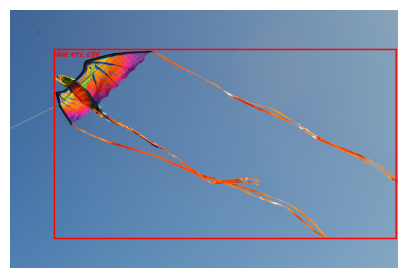

In [ ]:
detect_and_draw("./kite/kite_1_vasilisk-yadovity_3.jpg", 'whole kite.')

/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:518: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  y_embed = pixel_mask.cumsum(1, dtype=torch.float32)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:519: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  x_embed = pixel_

LAble : whole kite
0.908254


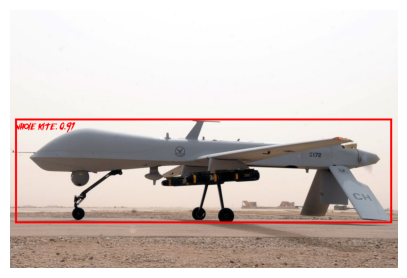

In [ ]:
detect_and_draw("./drone/drone_103_88.jpg", 'whole kite.')

In [ ]:
# чтобы не вылезла какая-то нелепая багуля
import locale
locale.getpreferredencoding = lambda: "UTF-8"

LABEL_DICT = {
    'whole dogs': 0,
    'whole wolves': 1,
}

In [ ]:
def save_images_as_yolo_dataset(processor, image_dir, dataset_dir, text, label_dict, prefix=''):
    """
    Прогоняем с помощью processor изображения из image_dir со списком возможных промтов text,
    после чего сохраняем их в dataset_dir, при необходимости дописывая prefix
    к имени и метке каждого изображения
    label_dict содержит отображение возможных промтов в метки классов
    """
    os.makedirs(os.path.join(dataset_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'labels'), exist_ok=True)
    for file in os.listdir(image_dir):
        if not('jpg' in file) and not('jpeg' in file):
            print(file)
            continue
        #image = Image.open(os.path.join(IMAGE_DIR, file)).convert("RGB")

        im_cv = cv2.imread(os.path.join(image_dir, file))
        image = cv2.cvtColor(im_cv, cv2.COLOR_BGR2RGB) # openCV читает изображения в BGR

        height, width, channels = image.shape

        inputs = processor(images=image, text=text, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)

        results = processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            box_threshold=0.2,
            text_threshold=0.3,
            target_sizes=[(height, width)]
        )
        result = results[0] # у нас размер батча 1
        # если хоть что-то распознали
        if result['labels']:
            # скопируем картинку в папку датасета
            shutil.copy2(os.path.join(image_dir, file), os.path.join(dataset_dir, "images", prefix + file))
            # вытащим имя картинки
            name, _ = os.path.splitext(file)
            with open(os.path.join(dataset_dir, "labels", prefix + name + '.txt'), 'w') as labelfile:
                for i in range(len(result['labels'])):
                    if result['labels'][i] in LABEL_DICT:
                        class_id = LABEL_DICT[result['labels'][i]]
                        # конвертируе|м box в yolo формат
                        bbox = xyxy2xywh(result['boxes'][i])
                        labelfile.write(f'{class_id} {bbox[0]/width} {bbox[1]/height} {bbox[2]/width} {bbox[3]/height}\n')
        else:
            print("No labels on image {}".format(file))



In [ ]:
IMAGE_DIR = "./mammals/dog/"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole dogs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./mammals/wolf/"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole wolves."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')
IMAGE_DIR = "./wolves_and_dogs/dogs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole dogs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./wolves_and_dogs/wolves"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole wolves."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')

IMAGE_DIR = "./wolves_and_dogs/pairs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole dogs. whole wolves."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='pair')

00000017.png


Premature end of JPEG file
Premature end of JPEG file


00000042.png
.ipynb_checkpoints


In [ ]:
# dataset_path = './wolves_and_dogs_dataset'
# viewer = YOLODatasetViewer(dataset_path)
# viewer.display_image('wolf7wolfs1.jpeg')

NameError: name 'YOLODatasetViewer' is not defined

In [ ]:
# dataset_path = './wolves_and_dogs_dataset'
# viewer = YOLODatasetViewer(dataset_path)
# viewer.display_batch()

In [ ]:
#viewer.display_batch()

In [ ]:
bad_images = ['dog00000000.jpg','dog00000011.jpg', 'dog00000013.jpg', 'dog00000023.jpg', 'dog00000025.jpg',
              'dog00000027.jpg', 'dog00000030.jpg', 'dog00000031.jpg', 'dog00000040.jpg', 'dog00000056.jpg',
              'dog00000058.jpg', 'dog00000064.jpg', 'dog00000078.jpg', 'dog00000085.jpg', 'dog00000091.jpg',
              'dog00000097.jpg', 'wolf00000010.jpg', 'wolf00000029.jpg', 'wolf00000038.jpg', 'wolf00000062.jpg',
              'wolf00000071.jpg', 'wolf00000075.jpg', 'wolf00000077.jpg', 'wolf00000085.jpg', 'dog2dogs1.jpg', 'dog2dogs1.jpeg',
              'dog5dogs1.jpeg', 'dog11dogs1.jpeg',
              'dog2dogs2.jpeg', 'dog2dogs3.jpeg','dog3dogs1.jpeg', 'dog3dogs2.jpeg', 'dog4dogs1.jpeg', 'pairpair1.jpeg',
              'pairpair2.jpeg', 'pairpair3.jpeg', 'wolf2wolfs1.jpeg', 'wolf2wolfs2.jpeg', 'wolf2wolfs3.jpeg',
              'wolf2wolfs4.jpeg', 'wolf2wolfs5.jpeg', 'wolf3wolfs1.jpeg', 'wolf3wolfs2.jpeg',
              'wolf3wolfs3.jpeg', 'wolf3wolfs4.jpeg', 'wolf3wolfs5.jpeg',
              'wolf4wolfs1.jpeg', 'wolf4wolfs2.jpeg', 'wolf4wolfs3.jpeg',
              'wolf5wolfs1.jpeg', 'wolf5wolfs2.jpeg', 'wolf5wolfs3.jpeg','wolf7wolfs1.jpeg']

#### Задание 2 (1 балл)
Так много картинок в помойку, жаль! По названиям видно, что сетка довольно плохо справилась с изображениями, где больше одного животного. Попробуйте подобрать к ним более эффективные промты и оставьте их в датасете.   

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

class YOLODatasetViewer:
    def __init__(self, dataset_path, batch_size=10):
        """
        Инициализация для последовательного просмотра YOLO-датасета.

        :param dataset_path: Путь к каталогу с датасетом (должен содержать папки images и labels).
        :param batch_size: Количество изображений на одной "странице" (по умолчанию 10).
        """
        self.dataset_path = dataset_path
        self.batch_size = batch_size
        self.images_dir = os.path.join(dataset_path, 'images')
        self.labels_dir = os.path.join(dataset_path, 'labels')

        # Получаем все изображения в папке
        self.image_files = sorted([f for f in os.listdir(self.images_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')])
        self.total_images = len(self.image_files)
        self.current_index = 0


    def display_batch(self):
        """
        Отображает следующий пакет изображений с метками.
        """
        # Проверяем, есть ли еще изображения для отображения
        if self.current_index >= self.total_images:
            print("Вы просмотрели все изображения.")
            return

        # Определяем количество изображений в текущем пакете
        num_images = min(self.batch_size, self.total_images - self.current_index)

        # Создаем фигуру для отображения
        fig, axes = plt.subplots(2, 5, figsize=(15, 8))
        axes = axes.flatten()

        # Отображаем текущий пакет изображений
        for i in range(num_images):
            image_path = os.path.join(self.images_dir, self.image_files[self.current_index + i])
            label_path = os.path.join(self.labels_dir, self.image_files[self.current_index + i].replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

            # Читаем изображение
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

            # Проверка наличия файла с метками
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    labels = f.readlines()

                for label in labels:
                    # Парсим данные (class_id x_center y_center width height)
                    parts = label.strip().split()
                    class_id, x_center, y_center, width, height = map(float, parts)

                    # Преобразуем координаты YOLO в пиксели
                    img_height, img_width, _ = image.shape
                    x_center *= img_width
                    y_center *= img_height
                    width *= img_width
                    height *= img_height

                    # Рассчитываем координаты прямоугольника
                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)


                    # Отображаем прямоугольник
                    image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

            # Отображаем картинку на subplot
            axes[i].imshow(image)
            axes[i].axis('off')
            axes[i].set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()

        # Обновляем индекс для следующего пакета
        self.current_index += num_images

    def reset(self):
        """
        Сбрасывает просмотр на первое изображение.
        """
        self.current_index = 0

    def display_image(self, title):
        fig, axes = plt.subplots(1,figsize=(15, 8))

        image_path = os.path.join(self.images_dir, title)
        label_path = os.path.join(self.labels_dir, title.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

        # Читаем изображение
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

        # Проверка наличия файла с метками
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                labels = f.readlines()

            for label in labels:
                # Парсим данные (class_id x_center y_center width height)
                parts = label.strip().split()
                class_id, x_center, y_center, width, height = map(float, parts)

                # Преобразуем координаты YOLO в пиксели
                img_height, img_width, _ = image.shape
                x_center *= img_width
                y_center *= img_height
                width *= img_width
                height *= img_height

                # Рассчитываем координаты прямоугольника
                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)


                # Отображаем прямоугольник
                image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

        # Отображаем картинку на subplot
        axes.imshow(image)
        axes.axis('off')
        axes.set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()


# Пример использования:
# dataset_path = '/path/to/your/yolo/dataset'
# viewer = YOLODatasetViewer(dataset_path)
# viewer.display_batch()  # Покажет первые 10 изображений


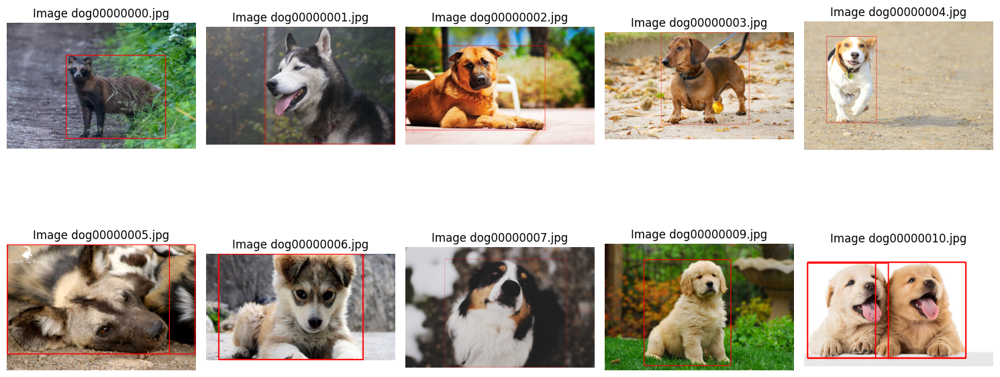

In [ ]:
dataset_path = './wolves_and_dogs_dataset'
viewer = YOLODatasetViewer(dataset_path)
viewer.display_batch()

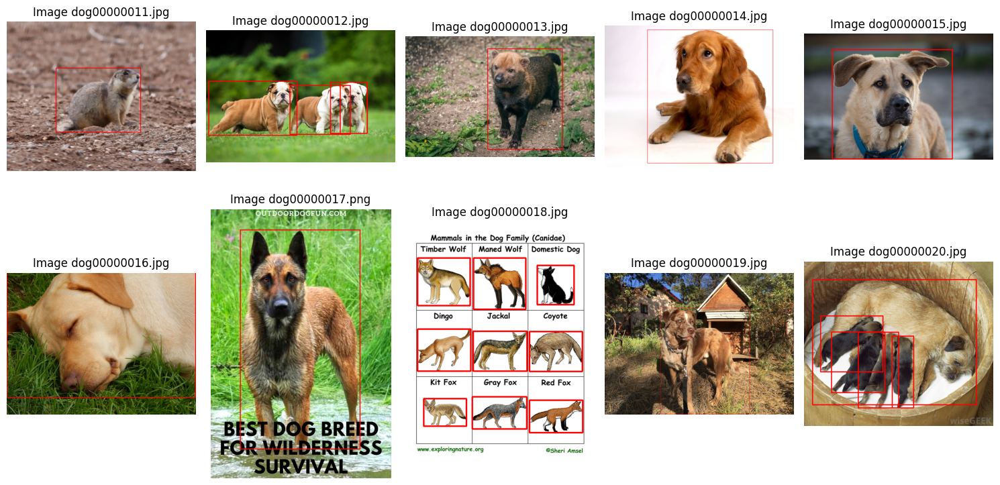

In [ ]:
viewer.display_batch()

LAble : whole everyone wolfs
0.580248
LAble : whole everyone wolfs
0.33719507
LAble : whole everyone wolfs
0.33388734
LAble : whole everyone wolfs
0.32107452
LAble : whole everyone wolfs
0.3148983
LAble : everyone wolfs
0.31312835


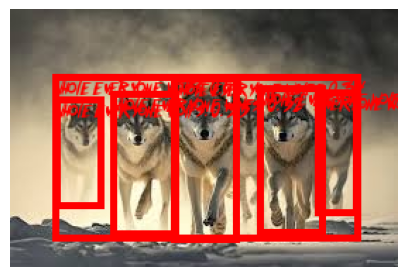

In [ ]:
promt = "whole everyone wolfs."
detect_and_draw("./wolves_and_dogs/wolves/7wolfs1.jpeg", promt, 10)

In [ ]:
image =  Image.open('./wolves_and_dogs/wolves/1wolf2.jpeg')
type(image)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

class YoloPromtComparison:
    def __init__(self, promts, dataset_path, batch_size=1):
        """
        Скопировала Ваш код и добавила список промтов, которые я хочу сравнивать
        """
        self.dataset_path = dataset_path
        self.batch_size = batch_size
        self.images_dir = os.path.join(dataset_path, 'images')
        self.promts = promts

        # Получаем все изображения в папке
        self.image_files = sorted([f for f in os.listdir(self.images_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')])
        self.total_images = len(self.image_files)
        self.current_index = 0

    def get_promt_detection(self, image, promt):
        """
        Чуть переписала метод для детекции
        """
        text = promt.lower()
        inputs = processor(images=image, text=promt, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)

        results = processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            box_threshold=0.2,
            text_threshold=0.3,
            target_sizes=[image.size[::-1]]
        )

        coords_and_scores = []

        for result in results:
            boxes = result['boxes'].cpu().numpy()  # Convert to numpy array
            scores = result['scores'].cpu().numpy()
            labels = result['labels']

            for box, score, label in zip(boxes, scores, labels):
                if label != '':
                    box = [int(b) for b in box]
                    coords_and_scores.append({
                        "coords": box,
                        "score": score
                    })
        return coords_and_scores


    def display_batch(self):
        """
        Отображает следующий пакет изображений с метками.
        """
        # Проверяем, есть ли еще изображения для отображения
        if self.current_index >= self.total_images:
            print("Вы просмотрели все изображения.")
            return

        # Определяем количество изображений в текущем пакете
        num_images = min(self.batch_size, self.total_images - self.current_index)

        # Создаем фигуру для отображения
        fig, axes = plt.subplots((len(self.promts) // 4) + int(len(self.promts) % 4 != 0), 4, figsize=(15, 8))
        #axes = axes.flatten()
        image_path = os.path.join(self.images_dir, self.image_files[self.current_index + 1])

        # Читаем изображение
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения
        imageForDetection = Image.open(image_path)



        for i in range(len(self.promts)):
            #Получаем детекцию Dino с определенным промтом
            cords_and_scores = self.get_promt_detection(imageForDetection, self.promts[i])


            for cord_and_score in cords_and_scores:
                cord = cord_and_score['coords']
                score = cord_and_score['score']
                # Отображаем прямоугольник
                image = cv2.rectangle(image, (cord[0], cord[1]), (cord[2], cord[3]), (255, 0, 0), 3)  # Красный прямоугольник
                scale = 1
                thickness = 2
                text_color = (57, 196, 225)  # Цвет текста
                bg_color = (25, 77, 135)     # Цвет подложки

                (text_width, text_height), baseline = cv2.getTextSize( f"{self.promts[i]} - {score:2f}", cv2.FONT_HERSHEY_SIMPLEX+20, scale, thickness)
                x, y = 100, 100  # Позиции текста

                #cv2.rectangle(image, (x, y - text_height - baseline), (x + text_width, y + baseline), bg_color, -1)

                #cv2.putText(image, f"{self.promts[i]} - {score:2f}", (x, y), cv2.FONT_HERSHEY_SIMPLEX+20, scale, text_color, thickness, lineType=cv2.LINE_AA)



            # Отображаем картинку на subplot
            axes[i//4][i%4].imshow(image)
            axes[i//4][i%4].axis('off')
            axes[i//4][i%4].set_title(f"{self.promts[i]} - {score:2f}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()

        # Обновляем индекс для следующего пакета
        self.current_index += num_images

    def reset(self):
        """
        Сбрасывает просмотр на первое изображение.
        """
        self.current_index = 0


    def display_image(self, title):
        fig, axes = plt.subplots((len(self.promts) // 4) + int(len(self.promts) % 4 != 0), 4, figsize=(15, 8))
        image_path = os.path.join(self.images_dir, title)

        # Читаем изображение
        image = cv2.imread(image_path)
        height, width, channels = image.shape

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения
        imageForDetection = Image.open(image_path)
        font =  cv2.FONT_HERSHEY_SIMPLEX+20
        # Проверка наличия файла с метками
        for i in range(len(self.promts)):
            #Получаем детекцию Dino с определенным промтом
            cords_and_scores = self.get_promt_detection(imageForDetection, self.promts[i])

            for cord_and_score in cords_and_scores:
                cord = cord_and_score['coords']
                score = cord_and_score['score']
                # Отображаем прямоугольник
                image = cv2.rectangle(image, (cord[0], cord[1]), (cord[2], cord[3]), (255, 0, 0), 3)  # Красный прямоугольник
                scale = 1
                thickness = 2
                text_color = (57, 196, 225)  # Цвет текста
                bg_color = (25, 77, 135)     # Цвет подложки
                desired_width = width - 100
                desired_height = height - 100

                while True:
                    (text_width, text_height), baseline = cv2.getTextSize(f"{self.promts[i]} - {score:2f}", font, scale, thickness)
                    if text_width <= desired_width and text_height <= desired_height:
                        break
                    scale -= 0.1

                (text_width, text_height), baseline = cv2.getTextSize( f"{self.promts[i]} - {score:2f}", font, scale, thickness)
                x, y = 100, 100  # Позиции текста

                #cv2.rectangle(image, (x, y - text_height - baseline), (x + text_width, y + baseline), bg_color, -1)

                #cv2.putText(image, f"{self.promts[i]} - {score:2f}", (x, y),font, scale, text_color, thickness, lineType=cv2.LINE_AA)
            try:
                avg_score = sum([float(i['score']) for i in cords_and_scores]) / len(cords_and_scores)
            except:
                avg_score = 0
        # Отображаем картинку на subplot
            axes[i//4][i%4].imshow(image)
            axes[i//4][i%4].axis('off')
            axes[i//4][i%4].set_title(f"{self.promts[i]} - {avg_score:2f}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()


# Пример использования:
# dataset_path = '/path/to/your/yolo/dataset'
# viewer = YOLODatasetViewer(dataset_path)
# viewer.display_batch()  # Покажет первые 10 изображений


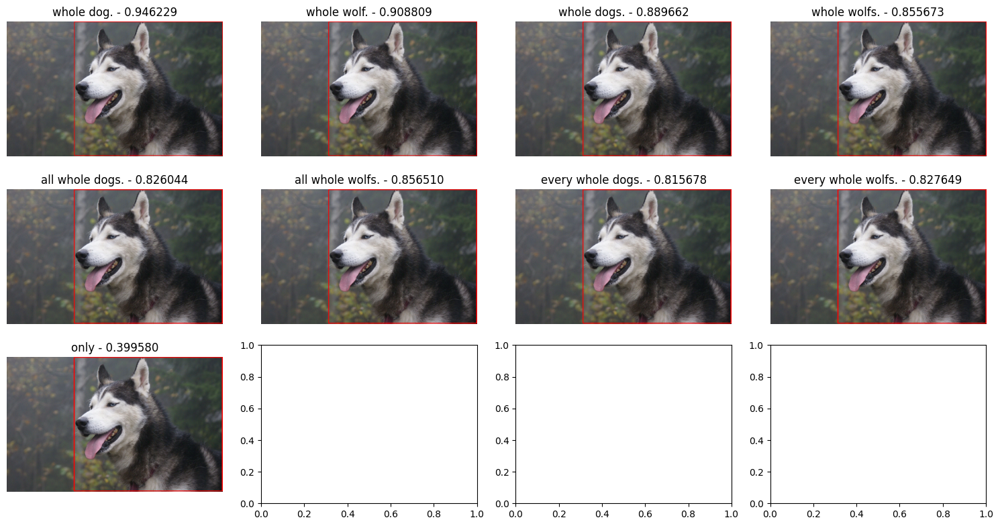

In [ ]:
dataset_path = './wolves_and_dogs_dataset'
viewer = YoloPromtComparison(["whole dog.",
                              "whole wolf.",
                              "whole dogs.",
                              "whole wolfs.",
                              "all whole dogs.",
                              "all whole wolfs.",
                              "every whole dogs.",
                              "every whole wolfs.",
                             "only"],dataset_path)
viewer.display_batch()

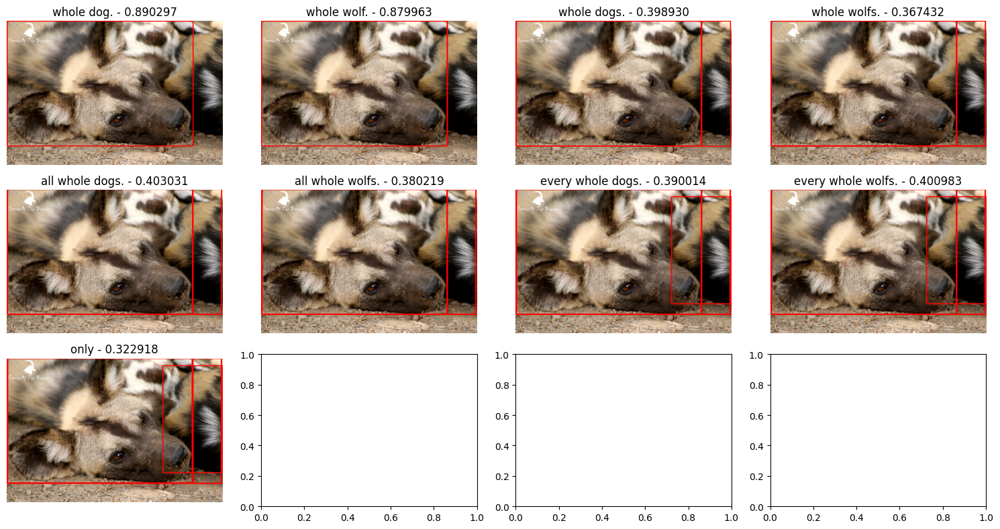

In [ ]:
viewer.display_batch()

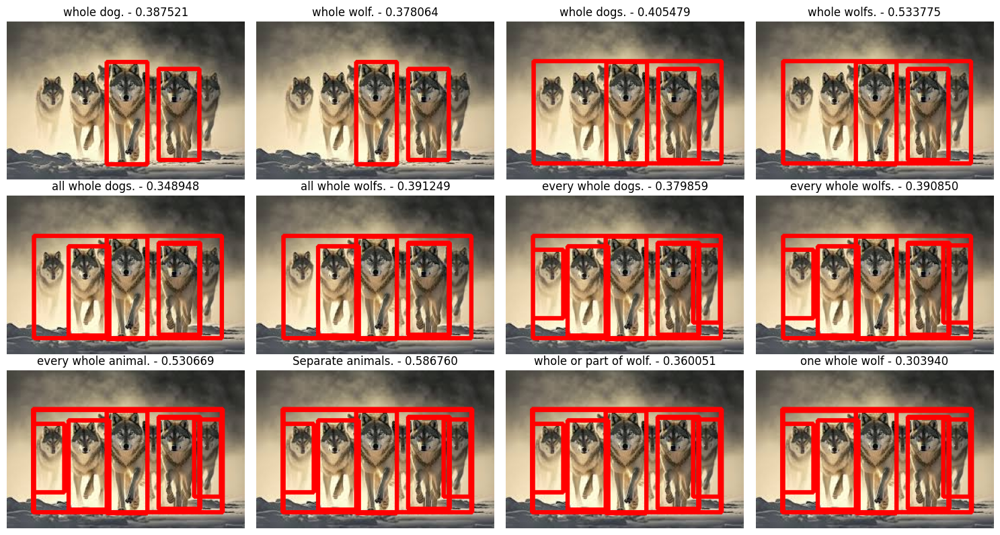

In [ ]:
viewer = YoloPromtComparison(["whole dog.",
                              "whole wolf.",
                              "whole dogs.",
                              "whole wolfs.",
                              "all whole dogs.",
                              "all whole wolfs.",
                              "every whole dogs.",
                              "every whole wolfs.",
                              "every whole animal.",
                              'Separate animals.',
                             'whole or part of wolf.',
                             'one whole wolf'],dataset_path)

viewer.display_image("wolf7wolfs1.jpeg")

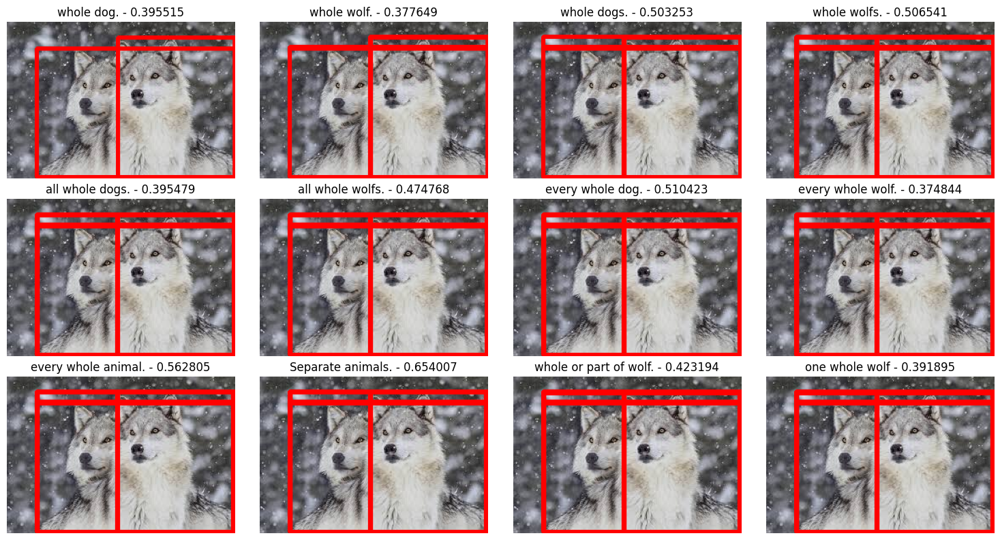

In [ ]:
viewer.display_image("wolf2wolfs4.jpeg")

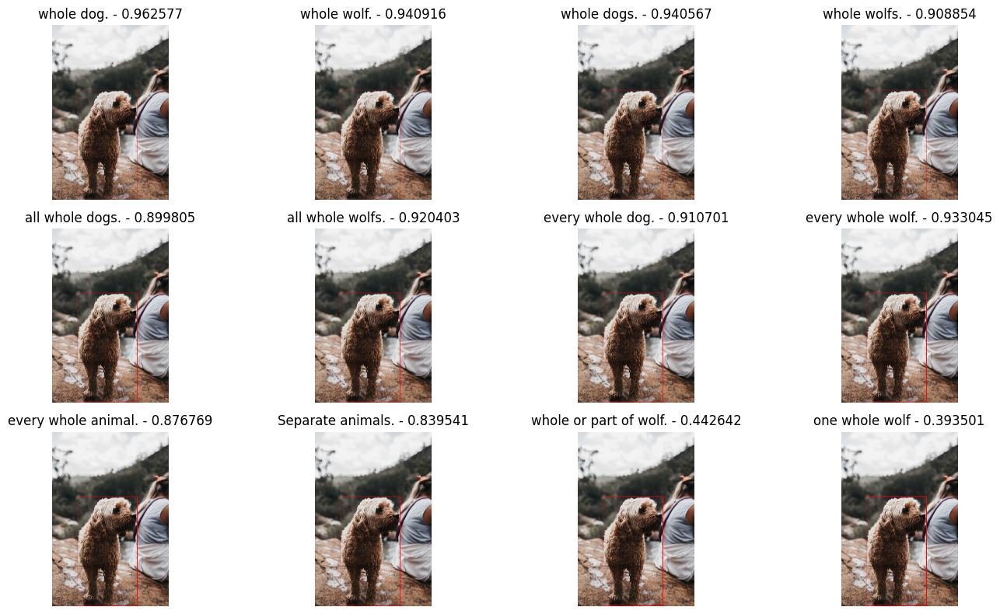

In [ ]:
viewer.display_image("dog00000037.jpg")

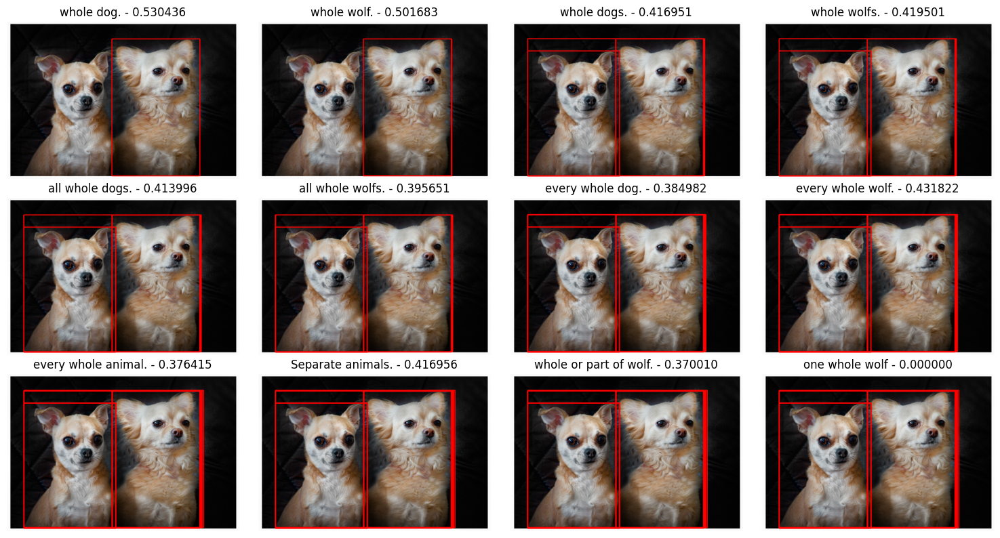

In [ ]:
viewer.display_image("dog00000073.jpg")

LAble : every whole animals
0.65953475


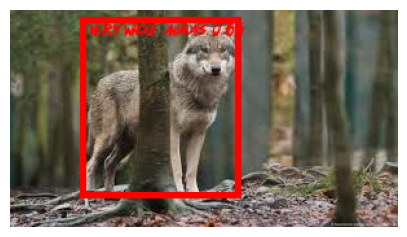

In [ ]:
promt = 'every whole animals.'
detect_and_draw("./wolves_and_dogs/wolves/1wolf2.jpeg", promt, 10)

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

LABEL_DICT = {
    'whole everyone dogs': 0,
    'whole everyone wolfs': 1,
}
IMAGE_DIR = "./mammals/dog/"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone dogs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./mammals/wolf/"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone wolfs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')
IMAGE_DIR = "./wolves_and_dogs/dogs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone dogs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./wolves_and_dogs/wolves"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone wolfs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')

IMAGE_DIR = "./wolves_and_dogs/pairs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone dogs. whole everyone wolfs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='pair')

#Extended from Dania

IMAGE_DIR = "./wolfs_and_dogs_extended/dogs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone dogs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./wolfs_and_dogs_extended/wolfs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone wolfs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')

IMAGE_DIR = "./wolfs_and_dogs_extended/pairs"
DATASET_DIR = "./wolves_and_dogs_dataset/"
text = ["whole everyone dogs. whole everyone wolfs."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='pair')

00000017.png


Premature end of JPEG file
Premature end of JPEG file


00000042.png
.ipynb_checkpoints
.ipynb_checkpoints
00000017.png
00000042.png
.ipynb_checkpoints
gray-wolf-endangered-thumb-s.png
wolf-4191896__480.png


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

class YOLODatasetViewer:
    def __init__(self, dataset_path, batch_size=10):
        """
        Инициализация для последовательного просмотра YOLO-датасета.

        :param dataset_path: Путь к каталогу с датасетом (должен содержать папки images и labels).
        :param batch_size: Количество изображений на одной "странице" (по умолчанию 10).
        """
        self.dataset_path = dataset_path
        self.batch_size = batch_size
        self.images_dir = os.path.join(dataset_path, 'images')
        self.labels_dir = os.path.join(dataset_path, 'labels')

        # Получаем все изображения в папке
        self.image_files = sorted([f for f in os.listdir(self.images_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')])
        self.total_images = len(self.image_files)
        self.current_index = 0


    def display_batch(self):
        """
        Отображает следующий пакет изображений с метками.
        """
        # Проверяем, есть ли еще изображения для отображения
        if self.current_index >= self.total_images:
            print("Вы просмотрели все изображения.")
            return

        # Определяем количество изображений в текущем пакете
        num_images = min(self.batch_size, self.total_images - self.current_index)

        # Создаем фигуру для отображения
        fig, axes = plt.subplots(2, 5, figsize=(15, 8))
        axes = axes.flatten()

        # Отображаем текущий пакет изображений
        for i in range(num_images):
            image_path = os.path.join(self.images_dir, self.image_files[self.current_index + i])
            label_path = os.path.join(self.labels_dir, self.image_files[self.current_index + i].replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

            # Читаем изображение
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

            # Проверка наличия файла с метками
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    labels = f.readlines()

                for label in labels:
                    # Парсим данные (class_id x_center y_center width height)
                    parts = label.strip().split()
                    class_id, x_center, y_center, width, height = map(float, parts)

                    # Преобразуем координаты YOLO в пиксели
                    img_height, img_width, _ = image.shape
                    x_center *= img_width
                    y_center *= img_height
                    width *= img_width
                    height *= img_height

                    # Рассчитываем координаты прямоугольника
                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)


                    # Отображаем прямоугольник
                    image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

            # Отображаем картинку на subplot
            axes[i].imshow(image)
            axes[i].axis('off')
            axes[i].set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()

        # Обновляем индекс для следующего пакета
        self.current_index += num_images

    def reset(self):
        """
        Сбрасывает просмотр на первое изображение.
        """
        self.current_index = 0

    def display_image(self, title):
        fig, axes = plt.subplots(1,figsize=(15, 8))

        image_path = os.path.join(self.images_dir, title)
        label_path = os.path.join(self.labels_dir, title.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

        # Читаем изображение
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

        # Проверка наличия файла с метками
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                labels = f.readlines()

            for label in labels:
                # Парсим данные (class_id x_center y_center width height)
                parts = label.strip().split()
                class_id, x_center, y_center, width, height = map(float, parts)

                # Преобразуем координаты YOLO в пиксели
                img_height, img_width, _ = image.shape
                x_center *= img_width
                y_center *= img_height
                width *= img_width
                height *= img_height

                # Рассчитываем координаты прямоугольника
                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)


                # Отображаем прямоугольник
                image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

        # Отображаем картинку на subplot
        axes.imshow(image)
        axes.axis('off')
        axes.set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()


# Пример использования:
# dataset_path = '/path/to/your/yolo/dataset'
# viewer = YOLODatasetViewer(dataset_path)
# viewer.display_batch()  # Покажет первые 10 изображений


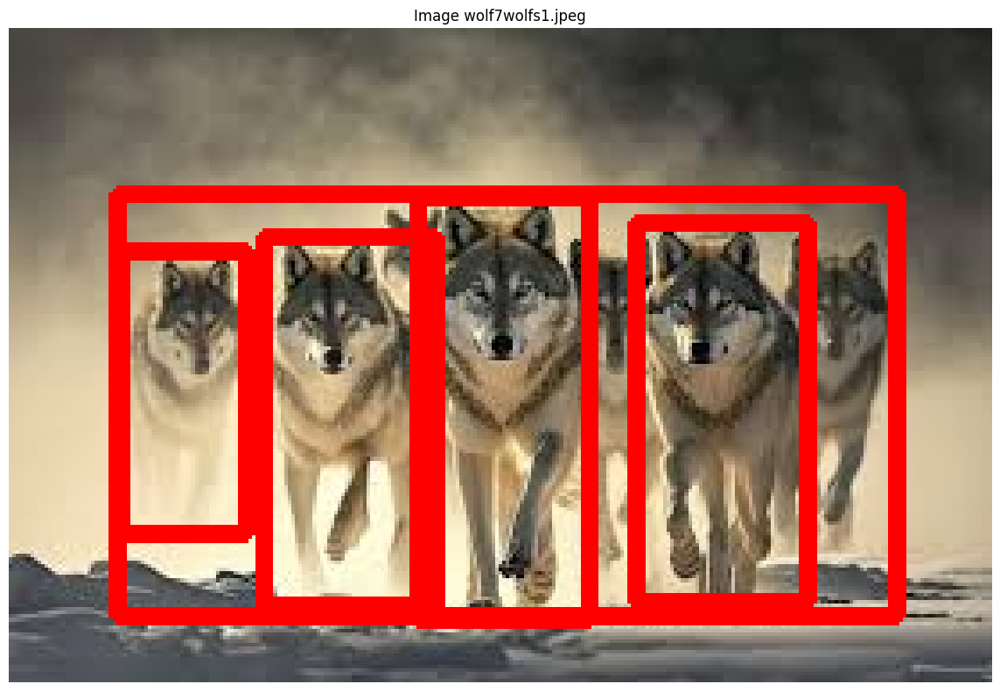

In [ ]:
dataset_path = './wolves_and_dogs_dataset'
viewer = YOLODatasetViewer(dataset_path)
viewer.display_image('wolf7wolfs1.jpeg')

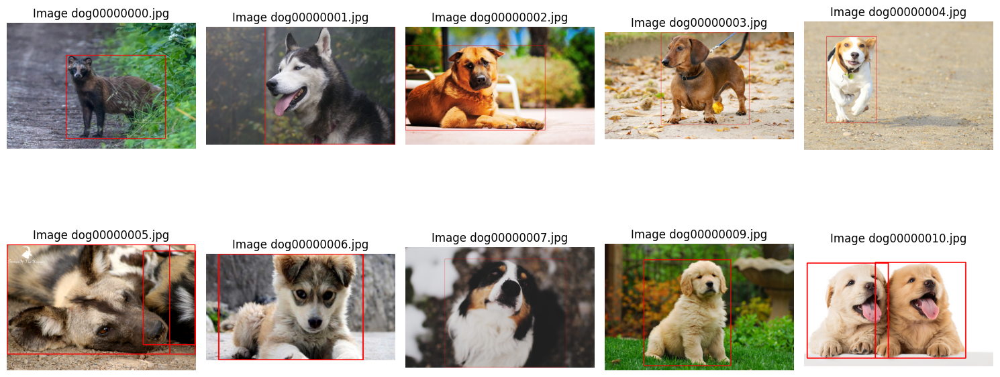

In [ ]:
viewer.display_batch()

In [ ]:
bad_images = ['dog00000000.jpg','dog00000011.jpg', 'dog00000013.jpg', 'dog00000023.jpg', 'dog00000025.jpg',
              'dog00000027.jpg', 'dog00000030.jpg', 'dog00000031.jpg', 'dog00000040.jpg',
              'dog00000058.jpg', 'dog00000064.jpg', 'dog00000085.jpg','dog00000087.jpg',  'dog00000091.jpg','dog00000092.jpg',
              'dog00000097.jpg',  'wolf00000062.jpg',
              'wolf00000071.jpg', 'wolf00000077.jpg', 'wolf00000089.jpg','wolf00000094.jpg', 'dog11dogs1.jpeg',
              'dog2dogs2.jpeg', 'dog3dogs2.jpeg', 'pairpair3.jpeg', 'wolf2wolfs3.jpeg',
              'wolf2wolfs5.jpeg', 'wolf3wolfs1.jpeg', 'wolf3wolfs2.jpeg',
              'wolf3wolfs3.jpeg', 'wolf3wolfs4.jpeg', 'wolf3wolfs5.jpeg',
              'wolf5wolfs1.jpeg', 'wolf5wolfs2.jpeg', 'wolf5wolfs3.jpeg']

In [ ]:
for file in bad_images:
    try:
        name, _ = os.path.splitext(file)
        os.remove(os.path.join(DATASET_DIR, 'images', file))
        os.remove(os.path.join(DATASET_DIR, 'labels', name + '.txt'))
    except FileNotFoundError:
        continue

В датасете YOLO еще обязательно должен быть yaml файл с классами и путями.

In [ ]:
!cp ./hw_week7/dataset.yaml ./wolves_and_dogs_dataset/

Засплитим наши данные на трейн, валидацию и тест. Валидация в нашем случае нужна для того, чтобы yolo могла проверить себя и убедиться, что лосс падает не только на обучающей выборке.

In [ ]:
import random

def split_yolo_dataset(dataset_path, val_size = 0.15, test_size = 0.15):
    os.makedirs(os.path.join(dataset_path, 'images', 'train'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'images', 'val'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'images', 'test'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'train'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'val'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'test'), exist_ok = True)
    files = [file for file in os.listdir(os.path.join(dataset_path, 'images')) if os.path.isfile(os.path.join(dataset_path, 'images', file))]
    for file in files:
        try:
            name, _ = os.path.splitext(file)
            roll = random.random()
            if roll < val_size:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'val'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'val'))
            elif roll < val_size + test_size:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'test'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'test'))
            else:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'train'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'train'))
        except Exception as e:
            print(e)


In [ ]:
split_yolo_dataset(DATASET_DIR)

Destination path './wolves_and_dogs_dataset/images/train/dog00000038.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000039.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000007.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000012.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000002.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000001.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000029.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000014.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000073.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000067.jpg' already exists
Destination path './wolves_and_dogs_dataset/images/train/dog00000098.jpg' already exists
Destination path './w

Загрузим самую маленькую модель семейства YOLO, nano. Поскольку у нас мало данных и простая задача, она кажется оптимальным выбором.

In [ ]:
yolo_model = YOLO("yolo11m.pt")

In [ ]:
DATASET_DIR = "/home/jupyter/work/resources/"

Запустим обучение на дефолтных параметрах, patience отвечает за раннюю остановку: если 10 эпох лосс на валидации не падает, обучение остановится. 100 эпох на таком маленьком датасете в любом случае пролетят быстро.

In [ ]:
!pwd

/home/jupyter/work/resources


In [ ]:
yolo_model.train(data='./wolves_and_dogs_dataset/dataset.yaml', device=device, plots=True, epochs=100, patience=10,
            batch=16)

New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=./wolves_and_dogs_dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train21, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None

train: Scanning /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/train... 1558 images, 0 backgrounds, 1 corrupt: 100%|██████████| 1558/1558 [00:08<00:00, 190.64it/s]

train: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/train/wolfimages110.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]


train: New cache created: /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/val/wolfimages227.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]


val: New cache created: /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/val.cache


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Plotting labels to runs/detect/train21/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train21
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.7G     0.9121      1.544      1.432         25        640: 100%|██████████| 98/98 [00:27<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.29it/s]

                   all        346        464      0.259      0.468      0.287      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.5G      1.304      1.628      1.709         15        640: 100%|██████████| 98/98 [00:21<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.64it/s]


                   all        346        464     0.0918      0.114      0.049     0.0152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.6G      1.353      1.712      1.735         16        640: 100%|██████████| 98/98 [00:21<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.82it/s]


                   all        346        464      0.226      0.304      0.168     0.0634

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.4G      1.278        1.6      1.678         18        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.03it/s]


                   all        346        464      0.307      0.478      0.287      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.5G      1.176      1.471        1.6         13        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.86it/s]

                   all        346        464      0.441      0.514      0.425      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.5G      1.141      1.417      1.575         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.562      0.585      0.577      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.5G       1.09      1.392      1.525         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.628      0.624      0.659      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.4G      1.059      1.312      1.524         17        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464       0.49      0.473       0.38      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.5G     0.9891       1.25      1.462         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.79it/s]

                   all        346        464      0.698       0.61      0.682      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.4G     0.9743      1.214      1.442         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.86it/s]

                   all        346        464      0.691      0.567      0.661      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.5G     0.9449      1.131      1.438         21        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.79it/s]

                   all        346        464      0.703      0.629      0.691      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.6G     0.9317       1.17      1.413         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.67it/s]

                   all        346        464      0.541      0.568      0.595      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.5G     0.8794      1.136      1.388         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.85it/s]

                   all        346        464      0.689      0.615      0.662      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.4G     0.9085      1.111      1.399         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.734      0.701       0.76      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.5G     0.9102      1.079      1.401         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.83it/s]


                   all        346        464      0.816      0.757      0.829      0.607

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.6G     0.8483      1.012      1.358         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.674      0.663      0.699      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.5G     0.8449      1.017      1.351         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.747      0.754      0.805      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.5G       0.85      1.024      1.358         18        640: 100%|██████████| 98/98 [00:21<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.792      0.733      0.807        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.5G     0.8198     0.9649      1.323          9        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.96it/s]

                   all        346        464      0.705      0.707      0.767      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.5G     0.8066     0.9646      1.332         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.818       0.77      0.844      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.6G      0.794     0.9493      1.312         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.801      0.687      0.815      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.5G     0.7832     0.9411      1.304         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.862      0.761       0.86      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.5G     0.7884     0.9556      1.313         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.823      0.769      0.837      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.5G     0.7544     0.8937      1.284         16        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.836      0.744      0.838      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.5G     0.7518     0.8834      1.283         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.866      0.701      0.826      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.6G     0.7631     0.8964       1.29         23        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464       0.79      0.721       0.81      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.5G     0.7237     0.8524      1.269         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.843      0.802      0.879      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.6G     0.7457     0.8905      1.275         24        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.872      0.772      0.854      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.5G     0.7483     0.8695      1.287         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.69it/s]


                   all        346        464      0.853      0.779      0.868      0.666

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.6G     0.7216     0.8576      1.261         14        640: 100%|██████████| 98/98 [00:21<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.83it/s]

                   all        346        464      0.828      0.798      0.868      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.5G     0.7088     0.8285      1.249         24        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.841       0.82      0.877      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.5G     0.7039     0.8253      1.258         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.899      0.763      0.865      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.5G     0.7078     0.8107      1.248         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.853      0.777      0.867      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.4G     0.6901     0.8081      1.235         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.06it/s]

                   all        346        464      0.856       0.75      0.858      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.5G     0.7152     0.7977      1.257         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.843      0.801      0.877      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.5G     0.6736     0.7806      1.225         20        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.73it/s]

                   all        346        464      0.862      0.836      0.897      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.5G     0.6475     0.7515      1.212         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464      0.874      0.793      0.874      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.5G     0.6815     0.7754      1.243         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.03it/s]

                   all        346        464      0.877      0.806       0.89      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.5G      0.665     0.7569      1.215         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.873      0.833      0.901      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.4G      0.634     0.7243      1.193         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464      0.877      0.797      0.878      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.5G     0.6604     0.7392      1.209         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.07it/s]

                   all        346        464      0.851       0.82      0.891       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.6G     0.6671      0.762      1.218         22        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.02it/s]

                   all        346        464      0.911      0.817      0.898      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.5G      0.632     0.7184      1.195         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.858      0.789      0.877      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.5G     0.6274     0.7362      1.201         14        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.838      0.827      0.881       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.5G      0.621     0.7063      1.185         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.891      0.835      0.896      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.4G      0.624     0.6965      1.185         20        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.863      0.832      0.909      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.5G     0.6097     0.6901       1.17         28        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.879      0.838      0.913      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.5G     0.6192     0.6904      1.189         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.877      0.816        0.9      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.5G     0.6104     0.6889      1.176         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.894      0.776      0.887       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.6G     0.6008     0.6645      1.181         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.892      0.849      0.902      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.5G     0.6082     0.6959      1.185         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.881      0.832      0.901      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.5G     0.6021     0.6777      1.181         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464       0.86      0.833      0.897      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.5G     0.5751     0.6291      1.153         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464       0.89      0.826       0.91      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.6G     0.6057     0.6701      1.185         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464      0.918      0.839      0.915      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.5G     0.5911      0.657      1.159         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464      0.907      0.816      0.902      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.5G      0.598     0.6536      1.169          8        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.905      0.823      0.902      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.5G      0.591      0.656      1.168         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464      0.831      0.877      0.901      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.4G      0.567     0.6496      1.157         13        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.865       0.82      0.896      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.5G     0.5793     0.6408      1.156         21        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.896      0.837      0.918      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.5G     0.5659      0.626      1.153         20        640: 100%|██████████| 98/98 [00:21<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.876      0.867      0.919      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.5G     0.5703     0.6149      1.143         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.03it/s]

                   all        346        464      0.912      0.851      0.914      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.5G     0.5498     0.5981      1.139         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464       0.89      0.861      0.913      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.5G     0.5517     0.6043      1.137         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.879      0.869      0.916      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.5G     0.5479     0.6029      1.137         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.918      0.813      0.908      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      10.5G     0.5394     0.5936      1.129         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.898      0.852      0.911      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.6G      0.533     0.5986      1.127         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.911       0.87      0.922       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.5G     0.5372     0.5941      1.126         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.907      0.816      0.905      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.5G     0.5331     0.5862      1.124         23        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.85it/s]

                   all        346        464      0.901      0.861      0.913      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.5G     0.5457     0.5736      1.135         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.00it/s]


                   all        346        464      0.901      0.871       0.92        0.8

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.6G     0.5257     0.5567      1.124         12        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.78it/s]

                   all        346        464       0.92      0.858      0.925      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.5G     0.5284     0.5702      1.131         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.928      0.851      0.921      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      10.5G     0.5358     0.5707      1.132         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.891      0.842      0.911      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.5G     0.5263     0.5571       1.12         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.902      0.871      0.925      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.6G     0.5095     0.5355      1.106         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.96it/s]

                   all        346        464      0.888      0.864      0.919      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.5G     0.5084     0.5422      1.114         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.00it/s]


                   all        346        464      0.932      0.861       0.93      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.5G     0.5078     0.5246      1.108         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]


                   all        346        464      0.935      0.821      0.917      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.5G     0.4964     0.5246      1.105         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.899      0.875      0.926      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.6G     0.5006     0.5337      1.106         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.903      0.862      0.921       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      10.5G     0.4913     0.5085      1.095         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.02it/s]

                   all        346        464      0.925      0.835      0.913      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.4G        0.5     0.5138      1.102         14        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.06it/s]

                   all        346        464      0.906      0.851      0.915      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.5G     0.4908     0.5187      1.105         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464       0.87      0.881      0.921      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.4G      0.484     0.5116      1.095         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.96it/s]

                   all        346        464        0.9      0.846      0.918      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.5G     0.4734     0.4866      1.083         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.904      0.868      0.925      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      10.6G     0.4755     0.4892      1.087         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.04it/s]

                   all        346        464      0.898      0.889      0.926      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.5G     0.4804     0.4971      1.087         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.04it/s]

                   all        346        464      0.906      0.884      0.931      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.4G     0.4775     0.4803      1.095         19        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.934      0.863      0.934      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.5G     0.4766     0.4811      1.095         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.925      0.867      0.935      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.6G     0.4616      0.476      1.072         24        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.886      0.883      0.929      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.5G     0.4625     0.4834      1.078         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.917       0.89      0.936      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.5G     0.4558     0.4633      1.079         19        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.937      0.862      0.934      0.839


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.5G     0.3338     0.3559          1          6        640: 100%|██████████| 98/98 [00:23<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464       0.94      0.843      0.927      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.4G     0.3193     0.3164     0.9778          6        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.78it/s]

                   all        346        464      0.921      0.868      0.928      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.5G     0.3045     0.3022     0.9654          5        640: 100%|██████████| 98/98 [00:20<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464      0.933      0.866      0.933      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.4G     0.3057     0.2964      0.967          5        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.923      0.887      0.934      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.5G     0.2999     0.2814     0.9676          7        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.77it/s]

                   all        346        464        0.9      0.883      0.935      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.4G     0.2886     0.2907      0.952         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.896      0.877      0.924      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.5G     0.2864     0.2786      0.951          6        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.914      0.886      0.933      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      10.5G     0.2821       0.27     0.9523          5        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.916      0.872      0.935      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.5G     0.2693      0.263      0.942          6        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.06it/s]

                   all        346        464      0.902      0.879      0.936      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.5G     0.2701     0.2646     0.9426          6        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.903      0.886      0.937      0.851



100 epochs completed in 0.714 hours.
Optimizer stripped from runs/detect/train21/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train21/weights/best.pt, 40.5MB

Validating runs/detect/train21/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
YOLO11m summary (fused): 303 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.42it/s]


                   all        346        464      0.903      0.886      0.937      0.851
                   dog        167        202       0.87      0.921      0.938      0.847
                  wolf        180        262      0.937      0.851      0.936      0.856
Speed: 0.6ms preprocess, 2.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train21


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fcd345af700>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
#f = open("/home/jupyter/work/resources/datasets/dataset.yaml",'r').read()

In [ ]:
f = open("/home/jupyter/.config/Ultralytics/settings.json", 'r').read()
f

'{\n  "settings_version": "0.0.6",\n  "datasets_dir": "/home/jupyter/work/resources",\n  "weights_dir": "weights",\n  "runs_dir": "runs",\n  "uuid": "9da533cfc818d9d4518fc30e5ab6b84a0d555d6f992064cfe15328009e5d17a0",\n  "sync": true,\n  "api_key": "",\n  "openai_api_key": "",\n  "clearml": true,\n  "comet": true,\n  "dvc": true,\n  "hub": true,\n  "mlflow": true,\n  "neptune": true,\n  "raytune": true,\n  "tensorboard": true,\n  "wandb": false,\n  "vscode_msg": true\n}'

In [ ]:
#nf = '{\n  "settings_version": "0.0.6",\n  "datasets_dir": "/home/jupyter/work/resources",\n  "weights_dir": "weights",\n  "runs_dir": "runs",\n  "uuid": "9da533cfc818d9d4518fc30e5ab6b84a0d555d6f992064cfe15328009e5d17a0",\n  "sync": true,\n  "api_key": "",\n  "openai_api_key": "",\n  "clearml": true,\n  "comet": true,\n  "dvc": true,\n  "hub": true,\n  "mlflow": true,\n  "neptune": true,\n  "raytune": true,\n  "tensorboard": true,\n  "wandb": false,\n  "vscode_msg": true\n}'
#with open("/home/jupyter/.config/Ultralytics/settings.json", 'w') as nn:
#    nn.write(nf)

In [ ]:
#!cp -r /home/jupyter/datasphere/project/wolves_and_dogs_dataset /home/jupyter/work/resources/datasets

Сохраним модельку.

In [ ]:
yolo_model.save("wolf-dog.pt")

А теперь проверяем!

In [ ]:
results = yolo_model.predict("./hw_week7/dog.jpeg")
results[0].show()


image 1/1 /home/jupyter/work/resources/hw_week7/dog.jpeg: 448x640 1 dog, 81.6ms
Speed: 2.3ms preprocess, 81.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


In [ ]:
results[0].save(filename=f"./results10.jpg")

'./results10.jpg'

In [ ]:
results = yolo_model.predict("./hw_week7/wolf.jpeg")
results[0].show()



image 1/1 /home/jupyter/work/resources/hw_week7/wolf.jpeg: 608x640 1 wolf, 83.3ms
Speed: 3.1ms preprocess, 83.3ms inference, 2.9ms postprocess per image at shape (1, 3, 608, 640)


In [ ]:
results[0].save(filename=f"./results8.jpg")

'./results8.jpg'

Ну все, волк теперь доволен! Давайте для контроля теперь глянем на метрики на тесте. Подробнее о метриках для детекции [здесь](https://docs.ultralytics.com/guides/yolo-performance-metrics/).

In [ ]:
metrics = yolo_model.val(data='./wolves_and_dogs_dataset/dataset.yaml', split="test", device=device, )

Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)


val: Scanning /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/test... 360 images, 0 backgrounds, 2 corrupt: 100%|██████████| 360/360 [00:00<00:00, 453.43it/s]

val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/test/dogn02089973_2781.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]
val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/test/wolfimages339.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]


val: New cache created: /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/test.cache


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

                   all        358        480      0.921      0.814      0.899      0.792
                   dog        171        219      0.907      0.846      0.889      0.779
                  wolf        188        261      0.934      0.782      0.909      0.804
Speed: 0.3ms preprocess, 11.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train213


Поскольку наш датасет очень маленький, вопрос с аугментациями в нем стоит еще острее, чем обычно. В YOLO много своих аугментаций, особый упор они делают на сложные Mosaic и Mixup аугментации, которые смешивают изображения. А вот настраивать некоторые простые свои может оказаться затруднительно. Однако, через костыльный [манки-патчинг](https://en.wikipedia.org/wiki/Monkey_patch#:~:text=In%20computer%20programming%2C%20monkey%20patching,altering%20the%20original%20source%20code.) можно вставить в YOLO блок простых и понятных аугментаций из библиотеки Albumentations, список всех возможных [прилагается](https://albumentations.ai/docs/getting_started/transforms_and_targets/).

In [ ]:
from ultralytics.data.augment import Albumentations
from ultralytics.utils import LOGGER, colorstr

def __init__(self, p=1.0):
        """Initialize the transform object for YOLO bbox formatted params."""
        self.p = p
        self.transform = None
        prefix = colorstr("albumentations: ")
        try:
            import albumentations as A

            spatial_transforms = {
                "Affine",
                "BBoxSafeRandomCrop",
                "CenterCrop",
                "CoarseDropout",
                "Crop",
                "CropAndPad",
                "CropNonEmptyMaskIfExists",
                "D4",
                "ElasticTransform",
                "Flip",
                "GridDistortion",
                "GridDropout",
                "HorizontalFlip",
                "Lambda",
                "LongestMaxSize",
                "MaskDropout",
                "MixUp",
                "Morphological",
                "NoOp",
                "OpticalDistortion",
                "PadIfNeeded",
                "Perspective",
                "PiecewiseAffine",
                "PixelDropout",
                "RandomCrop",
                "RandomCropFromBorders",
                "RandomGridShuffle",
                "RandomResizedCrop",
                "RandomRotate90",
                "RandomScale",
                "RandomSizedBBoxSafeCrop",
                "RandomSizedCrop",
                "Resize",
                "Rotate",
                "SafeRotate",
                "ShiftScaleRotate",
                "SmallestMaxSize",
                "Transpose",
                "VerticalFlip",
                "XYMasking",
            }

            # Insert required transformation here
            T = [
                A.PixelDropout(p=0.1),
                A.RandomSizedCrop(p=0.1),
                A.D4(p=0.1),
                A.Erasing(p=0.1),
                A.GridDropout(p=0.1),
                A.RandomRotate90(p=0.1),
                A.ShiftScaleRotate(p=0.1),
                A.XYMasking(p=0.1)
                ]
            self.contains_spatial = any(transform.__class__.__name__ in spatial_transforms for transform in T)
            self.transform = (
                A.Compose(T, bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"]))
                if self.contains_spatial
                else A.Compose(T)
            )

            LOGGER.info(prefix + ", ".join(f"{x}".replace("always_apply=False, ", "") for x in T if x.p))
        except ImportError:  # package not installed, skip
            pass
        except Exception as e:
            LOGGER.info(f"{prefix}{e}")

Albumentations.__init__ = __init__

#### Задание 3 (2 балла)
Подберите аугментации для йоло ([родные] или из Albumentations, как удобно), которые улучшат показатели по сравнению с дефолтными либо на этих данных, либо на ваших (смотри далее).

In [ ]:
yolo_model.train(data='./wolves_and_dogs_dataset/dataset.yaml', device=device, plots=True, epochs=100, patience=10,
            batch=16)

New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=./wolves_and_dogs_dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None

train: Scanning /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/train.cache... 1558 images, 0 backgrounds, 1 corrupt: 100%|██████████| 1558/1558 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/train/wolfimages110.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]


albumentations: RandomSizedCrop.__init__() missing 3 required positional arguments: 'min_max_height', 'height', and 'width'


val: Scanning /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/val.cache... 346 images, 1 backgrounds, 1 corrupt: 100%|██████████| 347/347 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/val/wolfimages227.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]


Plotting labels to runs/detect/train22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train22
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.4G     0.9273       1.54       1.44         18        640: 100%|██████████| 98/98 [00:27<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.06it/s]

                   all        346        464      0.379      0.428      0.318      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.6G       1.28      1.613      1.679         13        640: 100%|██████████| 98/98 [00:21<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.53it/s]


                   all        346        464      0.148      0.228      0.139     0.0511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.5G      1.349      1.672      1.731         16        640: 100%|██████████| 98/98 [00:21<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]


                   all        346        464      0.364      0.415      0.311      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.4G      1.294       1.65      1.696         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.89it/s]

                   all        346        464      0.276      0.616       0.39       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.5G      1.225      1.551      1.623         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.85it/s]

                   all        346        464      0.534      0.615      0.541      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.4G      1.158      1.457      1.581         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.593      0.549      0.579       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.6G      1.087      1.338      1.529         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.528      0.477      0.483      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.6G      1.053      1.295      1.498         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.82it/s]

                   all        346        464      0.685      0.678      0.727      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.5G      1.009      1.227      1.466         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464       0.76      0.637      0.725      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.4G       1.01      1.242      1.473         23        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.80it/s]

                   all        346        464      0.611       0.66      0.656      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.5G     0.9366      1.143      1.415         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.76it/s]

                   all        346        464      0.764      0.694      0.774      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.4G     0.9415       1.16      1.412         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.69it/s]

                   all        346        464      0.705      0.681      0.747      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.5G     0.9073      1.109      1.394         23        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.699      0.698      0.757      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.4G     0.8832      1.077      1.377          9        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.786      0.706      0.772      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.5G     0.8718      1.056      1.375         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.80it/s]

                   all        346        464      0.742      0.666      0.759      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.6G      0.872      1.039      1.369         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.652       0.72      0.736      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.5G     0.8526      1.026      1.352         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.807      0.722      0.824      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.6G     0.8245     0.9983      1.336         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.82it/s]

                   all        346        464      0.738       0.65      0.721      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.5G     0.8424      1.018      1.342         20        640: 100%|██████████| 98/98 [00:20<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464       0.71      0.644      0.687      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.6G     0.8271     0.9715      1.333         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.04it/s]

                   all        346        464      0.737      0.759      0.815      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.6G     0.8127     0.9773      1.325         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.843      0.723      0.815      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.6G     0.7726      0.923      1.294         19        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.844      0.762       0.84      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.5G     0.8017     0.9173       1.31         10        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.812      0.767      0.828      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.5G     0.7632     0.9147      1.295         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464      0.731      0.762      0.807      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.5G     0.7709     0.8997      1.296         13        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.88it/s]

                   all        346        464      0.823      0.748       0.83      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.4G     0.7544     0.8818      1.282         20        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.561      0.602      0.614      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.5G     0.7308     0.8696      1.268         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.00it/s]

                   all        346        464      0.811      0.765      0.852      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.5G     0.7412     0.8528      1.275         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.896      0.744      0.867      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.6G     0.7212     0.8376      1.257         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.79it/s]

                   all        346        464      0.863      0.761      0.851      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.6G     0.7423     0.8696      1.277         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.96it/s]

                   all        346        464      0.805      0.791      0.857       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.5G     0.6982     0.8212      1.237         19        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.854      0.792      0.881      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.5G     0.7125      0.792      1.249         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.779      0.789      0.847      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.6G     0.6892      0.787      1.235         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464       0.79       0.76      0.839      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.6G     0.6924     0.8133      1.238         19        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.93it/s]

                   all        346        464      0.869      0.773       0.86      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.5G     0.6681     0.7524      1.222         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.04it/s]

                   all        346        464      0.913      0.828      0.896      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.4G     0.6621     0.7757      1.216         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.879      0.771      0.867      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.5G     0.6801     0.8001      1.233         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464       0.86       0.82      0.877      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.4G     0.6614     0.7543      1.211         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.888      0.752      0.873      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.5G     0.6745     0.7802      1.225         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.902      0.787      0.884      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.4G     0.6613     0.7231      1.217         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.856      0.825      0.888      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.5G     0.6593       0.72      1.213          8        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.891      0.796      0.895      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.4G     0.6515     0.7572      1.208         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.818      0.797      0.884      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.5G     0.6298     0.7297      1.198         30        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.94it/s]

                   all        346        464      0.813      0.741      0.825      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.4G     0.6365      0.731      1.197         17        640: 100%|██████████| 98/98 [00:21<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.00it/s]

                   all        346        464      0.903      0.798       0.88      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.5G     0.6466     0.7131      1.201         11        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.872      0.811      0.887      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.4G     0.6244     0.6942      1.188         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464      0.919      0.794      0.883      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.5G     0.6188     0.6975      1.188         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.835      0.827      0.885      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.6G     0.6295     0.6911      1.191         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.866      0.795      0.874      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.6G     0.6205     0.6733      1.182         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.889      0.843      0.901       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.4G     0.6171     0.6882       1.18         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.876      0.839       0.89      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.5G     0.6014     0.6601      1.176         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.921      0.842      0.911      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.4G     0.6126     0.6869      1.178         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.03it/s]

                   all        346        464      0.888      0.805      0.895      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.5G     0.5798     0.6454      1.148         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.92it/s]

                   all        346        464      0.864      0.826      0.902      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.4G     0.5951     0.6575      1.172         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.02it/s]

                   all        346        464      0.919      0.821      0.898      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.5G     0.5975      0.649      1.172         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.912      0.833      0.914      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.4G     0.5884     0.6333      1.159         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.99it/s]

                   all        346        464      0.896      0.847      0.911      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.5G     0.5726     0.6283      1.154         15        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        346        464       0.91      0.825      0.907      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.5G     0.5824      0.621      1.144         14        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.858      0.859      0.904      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.6G     0.5691     0.6121       1.15         12        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.906      0.865       0.92      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.6G     0.5779     0.6306       1.15         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.98it/s]

                   all        346        464      0.912      0.847      0.922      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.5G     0.5586     0.6126      1.139         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464        0.9      0.834      0.903      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.4G     0.5538     0.6098      1.132         18        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.867      0.861      0.912      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.5G     0.5585     0.5895      1.139         22        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.06it/s]


                   all        346        464      0.941      0.825      0.909      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.6G     0.5455     0.5867      1.135         21        640: 100%|██████████| 98/98 [00:20<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.97it/s]

                   all        346        464      0.911      0.846      0.918      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      10.5G     0.5417      0.581      1.128         16        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.95it/s]

                   all        346        464      0.874       0.86       0.91      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.5G     0.5326      0.554       1.12         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.01it/s]

                   all        346        464      0.929      0.845      0.914       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.5G     0.5311     0.5661       1.12         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.84it/s]

                   all        346        464      0.873      0.842        0.9      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.6G      0.533     0.5771      1.119         17        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.91it/s]

                   all        346        464      0.922      0.839      0.908       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.6G     0.5413     0.5654      1.133          9        640: 100%|██████████| 98/98 [00:20<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.05it/s]

                   all        346        464      0.917      0.849      0.912      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.4G     0.5269     0.5635      1.113         24        640: 100%|██████████| 98/98 [00:20<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        346        464      0.923      0.856      0.919      0.798
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 60, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



70 epochs completed in 0.501 hours.
Optimizer stripped from runs/detect/train22/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train22/weights/best.pt, 40.5MB

Validating runs/detect/train22/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
YOLO11m summary (fused): 303 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.48it/s]


                   all        346        464      0.915      0.847      0.922      0.803
                   dog        167        202      0.862      0.881       0.93      0.797
                  wolf        180        262      0.968      0.813      0.915      0.809
Speed: 0.5ms preprocess, 2.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train22


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa2643583a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
metrics = yolo_model.val(data='./wolves_and_dogs_dataset/dataset.yaml', split="test", device=device, )

Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
YOLO11m summary (fused): 303 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


val: Scanning /home/jupyter/work/resources/wolves_and_dogs_dataset/labels/test.cache... 360 images, 0 backgrounds, 2 corrupt: 100%|██████████| 360/360 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/test/dogn02089973_2781.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]
val: WARNING ⚠️ /home/jupyter/work/resources/wolves_and_dogs_dataset/images/test/wolfimages339.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [          1]



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.42it/s]


                   all        358        480      0.888      0.801      0.871      0.726
                   dog        171        219      0.871      0.802      0.867       0.71
                  wolf        188        261      0.905        0.8      0.874      0.743
Speed: 0.4ms preprocess, 10.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train222


In [ ]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa3371b6980>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

Итак, я написал почти весь код сам, что же будете делать вы?

#### Задание 4 (4 балла)
Выберите 1 из классов, представленных в датасете COCO для детекции, и какой-нибудь другой класс, который не представлен в нем (+балл, если они реально похожи, как волки и собаки). Соберите данные, по аналогии с кодом выше разметьте их, обучите YOLO и продемонстрируйте результат. Модель сохраните и приложите к решению.

## Мои классы - бумажный змей и беспилотник

/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:518: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  y_embed = pixel_mask.cumsum(1, dtype=torch.float32)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:519: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  x_embed = pixel_

LAble : whole kite
0.5429361


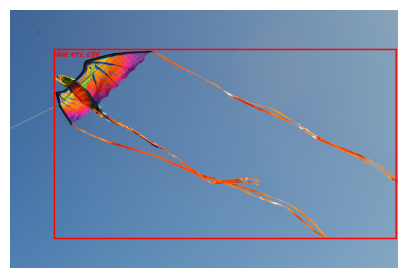

In [ ]:
detect_and_draw("./kite/kite_1_vasilisk-yadovity_3.jpg", 'whole kite.')

/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:518: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  y_embed = pixel_mask.cumsum(1, dtype=torch.float32)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:519: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  x_embed = pixel_

LAble : whole drone
0.9162141


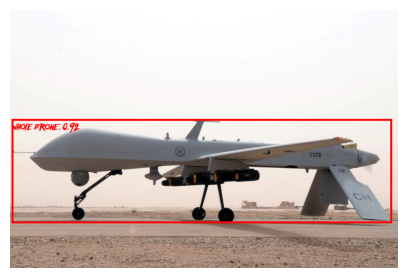

In [ ]:
detect_and_draw("./drone/drone_103_88.jpg", 'whole drone.')

In [ ]:
def save_images_as_yolo_dataset(processor, image_dir, dataset_dir, text, label_dict, prefix=''):
    """
    Прогоняем с помощью processor изображения из image_dir со списком возможных промтов text,
    после чего сохраняем их в dataset_dir, при необходимости дописывая prefix
    к имени и метке каждого изображения
    label_dict содержит отображение возможных промтов в метки классов
    """
    os.makedirs(os.path.join(dataset_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'labels'), exist_ok=True)
    for file in os.listdir(image_dir):
        if not('kite' in file) and not('drone' in file):
            print(file)
            continue
        #image = Image.open(os.path.join(IMAGE_DIR, file)).convert("RGB")
        try:
            im_cv = cv2.imread(os.path.join(image_dir, file))
            image = cv2.cvtColor(im_cv, cv2.COLOR_BGR2RGB) # openCV читает изображения в BGR
        except Exception as e:
            continue

        height, width, channels = image.shape

        inputs = processor(images=image, text=text, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)

        results = processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            box_threshold=0.2,
            text_threshold=0.3,
            target_sizes=[(height, width)]
        )
        result = results[0] # у нас размер батча 1
        # если хоть что-то распознали
        if result['labels']:
            # скопируем картинку в папку датасета
            shutil.copy2(os.path.join(image_dir, file), os.path.join(dataset_dir, "images", prefix + file))
            # вытащим имя картинки
            name, _ = os.path.splitext(file)
            with open(os.path.join(dataset_dir, "labels", prefix + name + '.txt'), 'w') as labelfile:
                for i in range(len(result['labels'])):
                    if result['labels'][i] in LABEL_DICT:
                        class_id = LABEL_DICT[result['labels'][i]]
                        # конвертируе|м box в yolo формат
                        bbox = xyxy2xywh(result['boxes'][i])
                        labelfile.write(f'{class_id} {bbox[0]/width} {bbox[1]/height} {bbox[2]/width} {bbox[3]/height}\n')
        else:
            print("No labels on image {}".format(file))



In [ ]:
# чтобы не вылезла какая-то нелепая багуля
import locale
locale.getpreferredencoding = lambda: "UTF-8"

LABEL_DICT = {
    'whole everyone kites': 0,
    'whole everyone drones': 1,
}
IMAGE_DIR = "./kite/"
DATASET_DIR = "./drones_and_kites_dataset/"
text = ["whole everyone kites."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='dog')

IMAGE_DIR = "./drone/"
DATASET_DIR = "./drones_and_kites_dataset/"
text = ["whole everyone drones."]

save_images_as_yolo_dataset(processor=processor, image_dir=IMAGE_DIR,
                            dataset_dir=DATASET_DIR, text=text, label_dict=LABEL_DICT, prefix='wolf')


/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:518: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  y_embed = pixel_mask.cumsum(1, dtype=torch.float32)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/models/grounding_dino/modeling_grounding_dino.py:519: UserWarning: cumsum_cuda_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:71.)
  x_embed = pixel_

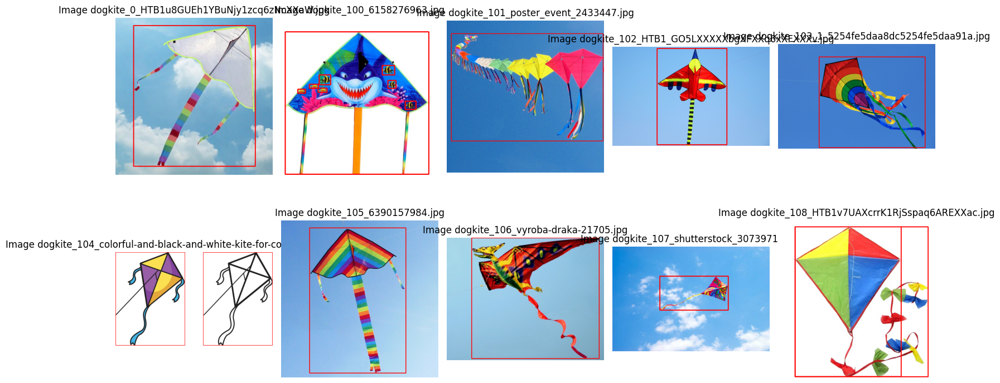

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

class YOLODatasetViewer:
    def __init__(self, dataset_path, batch_size=10):
        """
        Инициализация для последовательного просмотра YOLO-датасета.

        :param dataset_path: Путь к каталогу с датасетом (должен содержать папки images и labels).
        :param batch_size: Количество изображений на одной "странице" (по умолчанию 10).
        """
        self.dataset_path = dataset_path
        self.batch_size = batch_size
        self.images_dir = os.path.join(dataset_path, 'images')
        self.labels_dir = os.path.join(dataset_path, 'labels')

        # Получаем все изображения в папке
        self.image_files = sorted([f for f in os.listdir(self.images_dir) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')])
        self.total_images = len(self.image_files)
        self.current_index = 0


    def display_batch(self):
        """
        Отображает следующий пакет изображений с метками.
        """
        # Проверяем, есть ли еще изображения для отображения
        if self.current_index >= self.total_images:
            print("Вы просмотрели все изображения.")
            return

        # Определяем количество изображений в текущем пакете
        num_images = min(self.batch_size, self.total_images - self.current_index)

        # Создаем фигуру для отображения
        fig, axes = plt.subplots(2, 5, figsize=(15, 8))
        axes = axes.flatten()

        # Отображаем текущий пакет изображений
        for i in range(num_images):
            image_path = os.path.join(self.images_dir, self.image_files[self.current_index + i])
            label_path = os.path.join(self.labels_dir, self.image_files[self.current_index + i].replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

            # Читаем изображение
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

            # Проверка наличия файла с метками
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    labels = f.readlines()

                for label in labels:
                    # Парсим данные (class_id x_center y_center width height)
                    parts = label.strip().split()
                    class_id, x_center, y_center, width, height = map(float, parts)

                    # Преобразуем координаты YOLO в пиксели
                    img_height, img_width, _ = image.shape
                    x_center *= img_width
                    y_center *= img_height
                    width *= img_width
                    height *= img_height

                    # Рассчитываем координаты прямоугольника
                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)


                    # Отображаем прямоугольник
                    image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

            # Отображаем картинку на subplot
            axes[i].imshow(image)
            axes[i].axis('off')
            axes[i].set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()

        # Обновляем индекс для следующего пакета
        self.current_index += num_images

    def reset(self):
        """
        Сбрасывает просмотр на первое изображение.
        """
        self.current_index = 0

    def display_image(self, title):
        fig, axes = plt.subplots(1,figsize=(15, 8))

        image_path = os.path.join(self.images_dir, title)
        label_path = os.path.join(self.labels_dir, title.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

        # Читаем изображение
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразуем в RGB для правильного отображения

        # Проверка наличия файла с метками
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                labels = f.readlines()

            for label in labels:
                # Парсим данные (class_id x_center y_center width height)
                parts = label.strip().split()
                class_id, x_center, y_center, width, height = map(float, parts)

                # Преобразуем координаты YOLO в пиксели
                img_height, img_width, _ = image.shape
                x_center *= img_width
                y_center *= img_height
                width *= img_width
                height *= img_height

                # Рассчитываем координаты прямоугольника
                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)


                # Отображаем прямоугольник
                image = cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Красный прямоугольник

        # Отображаем картинку на subplot
        axes.imshow(image)
        axes.axis('off')
        axes.set_title(f"Image {image_path.split('/')[-1]}")

        # Показываем все изображения
        plt.tight_layout()
        plt.show()


# Пример использования:
dataset_path = './drones_and_kites_dataset'
viewer = YOLODatasetViewer(dataset_path)
viewer.display_batch()  # Покажет первые 10 изображений


In [ ]:
import random

def split_yolo_dataset(dataset_path, val_size = 0.15, test_size = 0.15):
    os.makedirs(os.path.join(dataset_path, 'images', 'train'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'images', 'val'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'images', 'test'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'train'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'val'), exist_ok = True)
    os.makedirs(os.path.join(dataset_path, 'labels', 'test'), exist_ok = True)
    files = [file for file in os.listdir(os.path.join(dataset_path, 'images')) if os.path.isfile(os.path.join(dataset_path, 'images', file))]
    for file in files:
        try:
            name, _ = os.path.splitext(file)
            roll = random.random()
            if roll < val_size:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'val'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'val'))
            elif roll < val_size + test_size:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'test'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'test'))
            else:
                shutil.move(os.path.join(dataset_path, 'images', file), os.path.join(dataset_path, 'images', 'train'))
                shutil.move(os.path.join(dataset_path, 'labels', name + '.txt'), os.path.join(dataset_path, 'labels', 'train'))
        except Exception as e:
            print(e)


In [ ]:
!cp ./hw_week7/dataset.yaml ./drones_and_kites_dataset/

In [ ]:
split_yolo_dataset(DATASET_DIR)

In [ ]:
yolo_model_kite_drone = YOLO("yolo11n.pt")

In [ ]:
yolo_model_kite_drone.train(data='./drones_and_kites_dataset/dataset.yaml', device=device, plots=True, epochs=100, patience=10,
            batch=16)

New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=./drones_and_kites_dataset/dataset.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train23, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=Non

train: Scanning /home/jupyter/work/resources/drones_and_kites_dataset/labels/train... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:01<00:00, 408.32it/s]

train: WARNING ⚠️ /home/jupyter/work/resources/drones_and_kites_dataset/images/train/dogkite_332_2018Creative_Wallpaper_Multicolored_kite_in_the_blue_sky_in_the_rays_of_the_sun_128860_.jpg: corrupt JPEG restored and saved


train: New cache created: /home/jupyter/work/resources/drones_and_kites_dataset/labels/train.cache
albumentations: RandomSizedCrop.__init__() missing 3 required positional arguments: 'min_max_height', 'height', and 'width'


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

val: New cache created: /home/jupyter/work/resources/drones_and_kites_dataset/labels/val.cache



huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The

Plotting labels to runs/detect/train23/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train23
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.93G     0.9982      2.677      1.439         35        640: 100%|██████████| 34/34 [00:08<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


                   all        116        161    0.00416      0.903      0.533      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.57G      1.097      1.877      1.499         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.46it/s]

                   all        116        161      0.359       0.33      0.286      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.55G      1.159      1.755      1.545         25        640: 100%|██████████| 34/34 [00:05<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]


                   all        116        161      0.437      0.439       0.39      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.54G      1.201      1.739      1.565         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.51it/s]

                   all        116        161      0.258      0.389      0.259     0.0848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.54G      1.193      1.624      1.582         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.82it/s]

                   all        116        161      0.487      0.543      0.494      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.54G      1.174       1.59      1.558         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.06it/s]

                   all        116        161      0.576      0.482      0.518      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.54G       1.15      1.523      1.535         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]

                   all        116        161      0.647      0.543      0.574      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.54G      1.118      1.386      1.523         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]

                   all        116        161      0.756      0.637      0.667      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.54G      1.115      1.458      1.516         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.41it/s]

                   all        116        161      0.469      0.577      0.462      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.54G       1.12       1.38      1.503         36        640: 100%|██████████| 34/34 [00:05<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.26it/s]


                   all        116        161      0.697      0.587      0.647      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.54G      1.077      1.319      1.487         31        640: 100%|██████████| 34/34 [00:05<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.16it/s]


                   all        116        161      0.855      0.617      0.689      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.54G      1.072      1.285      1.466         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]

                   all        116        161      0.744      0.582      0.671      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.54G      1.076      1.249      1.453         30        640: 100%|██████████| 34/34 [00:05<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.02it/s]

                   all        116        161      0.881      0.669      0.745      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.54G      1.006      1.234      1.422         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.69it/s]

                   all        116        161      0.766      0.683      0.717      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.54G      1.012      1.222      1.423         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        116        161      0.601      0.529       0.58      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.54G      1.011      1.192      1.423         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.21it/s]

                   all        116        161      0.767      0.689      0.738      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.54G     0.9865       1.18      1.418         37        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.87it/s]

                   all        116        161       0.88      0.561      0.659      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.54G     0.9579      1.108       1.39         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        116        161      0.868      0.659      0.726        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.54G      0.995      1.114      1.424         33        640: 100%|██████████| 34/34 [00:05<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.17it/s]

                   all        116        161      0.823      0.681      0.741      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.54G     0.9313      1.082      1.374         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.56it/s]

                   all        116        161       0.82      0.706      0.725      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.54G     0.9597      1.062       1.41         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.17it/s]

                   all        116        161      0.916      0.677      0.744      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.54G     0.9273      1.046      1.366         32        640: 100%|██████████| 34/34 [00:05<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]

                   all        116        161      0.841       0.71      0.751      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.54G     0.9092      1.016       1.34         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        116        161       0.86      0.653      0.748      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.54G     0.9038     0.9706      1.365         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.92it/s]

                   all        116        161      0.837      0.671      0.736       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.54G     0.8731     0.9978       1.35         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]

                   all        116        161      0.713      0.682      0.694      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.54G     0.9076     0.9797      1.364         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        116        161       0.89      0.649      0.749      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.54G     0.9222      1.017      1.368         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]

                   all        116        161      0.787      0.673      0.724      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.54G      0.894     0.9512      1.345         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.85it/s]


                   all        116        161       0.83      0.652      0.731      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.54G     0.8825      0.952      1.339         25        640: 100%|██████████| 34/34 [00:05<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.46it/s]

                   all        116        161      0.886      0.708      0.754      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.54G     0.9031     0.9643       1.35         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]

                   all        116        161      0.775      0.634      0.691      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.54G     0.8705     0.9438      1.322         36        640: 100%|██████████| 34/34 [00:05<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.50it/s]

                   all        116        161      0.728       0.72      0.726      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.54G     0.8669     0.9381      1.321         39        640: 100%|██████████| 34/34 [00:05<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.26it/s]

                   all        116        161      0.856      0.655      0.759      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.54G     0.8444     0.9192      1.307         20        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]

                   all        116        161      0.888       0.63      0.733      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.54G     0.8074     0.9044      1.288         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        116        161      0.834      0.731      0.755      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.54G     0.8386      0.897        1.3         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.44it/s]

                   all        116        161      0.908      0.711      0.791      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.54G     0.7986     0.8692      1.279         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.32it/s]

                   all        116        161      0.879      0.671      0.759      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.54G     0.8126     0.8406      1.293         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.11it/s]

                   all        116        161      0.905      0.658      0.759      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.54G     0.8278     0.9095      1.299         20        640: 100%|██████████| 34/34 [00:05<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.56it/s]

                   all        116        161      0.826      0.692      0.757      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.54G     0.7811     0.8314      1.266         32        640: 100%|██████████| 34/34 [00:05<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.38it/s]

                   all        116        161      0.924      0.694      0.764      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.54G     0.7821      0.838      1.257         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.18it/s]

                   all        116        161      0.863       0.69       0.76      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.54G     0.7555      0.822      1.245         34        640: 100%|██████████| 34/34 [00:05<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.54it/s]

                   all        116        161      0.874       0.68      0.772      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.54G     0.7895     0.8305      1.275         35        640: 100%|██████████| 34/34 [00:05<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.17it/s]

                   all        116        161      0.861      0.699      0.756      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.54G     0.7701     0.8246       1.26         37        640: 100%|██████████| 34/34 [00:05<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.94it/s]

                   all        116        161      0.921      0.688      0.788       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.54G     0.7506     0.7827      1.239         38        640: 100%|██████████| 34/34 [00:05<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.26it/s]

                   all        116        161      0.948      0.675      0.786      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.54G     0.7524     0.8133      1.242         36        640: 100%|██████████| 34/34 [00:05<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]


                   all        116        161      0.864      0.688      0.776      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.54G     0.7342     0.7908      1.236         37        640: 100%|██████████| 34/34 [00:05<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.05it/s]

                   all        116        161      0.928       0.69      0.783      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.54G     0.7484     0.7818      1.254         20        640: 100%|██████████| 34/34 [00:05<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.48it/s]

                   all        116        161      0.909      0.627      0.759      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.54G       0.75     0.7913      1.243         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]

                   all        116        161      0.887      0.676      0.781      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.54G     0.7725     0.7943      1.268         33        640: 100%|██████████| 34/34 [00:05<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]

                   all        116        161      0.911      0.676      0.761      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.54G     0.7028      0.734      1.212         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.28it/s]

                   all        116        161      0.933      0.726       0.81      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.54G     0.7174     0.7612      1.233         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.98it/s]

                   all        116        161      0.859      0.727      0.804      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.54G     0.7046     0.7279       1.22         23        640: 100%|██████████| 34/34 [00:05<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.17it/s]

                   all        116        161      0.947      0.699      0.795      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.54G     0.7009     0.7274      1.211         25        640: 100%|██████████| 34/34 [00:05<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.78it/s]

                   all        116        161        0.9      0.654      0.763      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.54G     0.6825      0.714      1.203         27        640: 100%|██████████| 34/34 [00:05<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.63it/s]

                   all        116        161      0.872      0.674      0.759      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.54G     0.6827     0.7038      1.208         19        640: 100%|██████████| 34/34 [00:05<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.88it/s]

                   all        116        161      0.901      0.714      0.787       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.54G     0.6714     0.6856      1.185         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]

                   all        116        161      0.881      0.736      0.807      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.54G     0.6808     0.6998      1.204         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.63it/s]

                   all        116        161      0.892      0.725      0.799      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.54G     0.6748     0.6825      1.196         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.86it/s]

                   all        116        161      0.899      0.708       0.81      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.54G      0.677     0.6877      1.198         33        640: 100%|██████████| 34/34 [00:05<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.32it/s]

                   all        116        161      0.861      0.743      0.813      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.54G     0.6786     0.6844      1.189         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]

                   all        116        161       0.93      0.706      0.792      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.54G     0.6604      0.676      1.192         25        640: 100%|██████████| 34/34 [00:05<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.21it/s]

                   all        116        161      0.881      0.729      0.814      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.54G     0.6873     0.6931      1.209         31        640: 100%|██████████| 34/34 [00:05<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.94it/s]

                   all        116        161      0.845      0.722      0.783       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.54G     0.6472     0.6708       1.17         36        640: 100%|██████████| 34/34 [00:05<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.59it/s]

                   all        116        161      0.956      0.691      0.804      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.54G     0.6271     0.6356      1.165         18        640: 100%|██████████| 34/34 [00:05<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]

                   all        116        161      0.838      0.741      0.806       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.54G     0.6459     0.6661      1.157         41        640: 100%|██████████| 34/34 [00:05<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.34it/s]

                   all        116        161      0.913      0.697      0.789      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.54G     0.6241     0.6517      1.158         31        640: 100%|██████████| 34/34 [00:05<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.28it/s]

                   all        116        161      0.871      0.739      0.814      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.54G      0.645     0.6418      1.189         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.62it/s]

                   all        116        161      0.888        0.7      0.798      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.54G     0.6348     0.6503       1.16         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.52it/s]

                   all        116        161      0.931      0.697        0.8      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.54G     0.6461     0.6451      1.178         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.22it/s]

                   all        116        161      0.903      0.708      0.799      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.54G     0.6382     0.6151      1.165         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.72it/s]

                   all        116        161      0.911      0.705      0.815      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.54G     0.5962     0.5965      1.141         30        640: 100%|██████████| 34/34 [00:05<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.81it/s]

                   all        116        161      0.912      0.728      0.812      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.54G     0.6342     0.6367      1.166         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]

                   all        116        161      0.892      0.714      0.805      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.54G     0.6116     0.6052      1.158         18        640: 100%|██████████| 34/34 [00:05<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.13it/s]

                   all        116        161      0.883      0.735      0.814      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.54G     0.6088     0.6044      1.162         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.97it/s]

                   all        116        161       0.89      0.722      0.796      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.54G     0.5854     0.6082      1.142         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.93it/s]

                   all        116        161      0.893      0.738      0.817      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.54G     0.5975     0.5888      1.136         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.60it/s]

                   all        116        161      0.902      0.736      0.808      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.54G     0.5973     0.5904      1.146         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.62it/s]

                   all        116        161      0.914      0.736      0.808      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.54G     0.6021     0.6116      1.142         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.95it/s]

                   all        116        161      0.917      0.722       0.82      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.54G     0.5796     0.5919      1.127         21        640: 100%|██████████| 34/34 [00:05<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        116        161      0.925      0.733      0.823      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.54G     0.6034     0.6072      1.142         24        640: 100%|██████████| 34/34 [00:05<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.68it/s]

                   all        116        161      0.939      0.722      0.824       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.54G     0.5965     0.5822      1.124         26        640: 100%|██████████| 34/34 [00:05<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.52it/s]

                   all        116        161      0.905      0.749      0.824      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.54G     0.6057      0.592      1.144         29        640: 100%|██████████| 34/34 [00:05<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.75it/s]

                   all        116        161      0.897      0.753      0.819      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.54G     0.5782     0.5834      1.122         33        640: 100%|██████████| 34/34 [00:05<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        116        161      0.889      0.754      0.812      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.54G     0.5723     0.5813      1.114         25        640: 100%|██████████| 34/34 [00:05<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.45it/s]

                   all        116        161      0.897      0.701       0.81      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.54G     0.5679      0.572      1.139         32        640: 100%|██████████| 34/34 [00:05<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.31it/s]

                   all        116        161      0.906      0.697      0.798       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.54G     0.5673     0.5822      1.124         28        640: 100%|██████████| 34/34 [00:05<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.80it/s]


                   all        116        161      0.873      0.732      0.818       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.54G       0.54     0.5366      1.089         31        640: 100%|██████████| 34/34 [00:05<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  7.00it/s]

                   all        116        161      0.921      0.738      0.823      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.54G     0.5757     0.5664      1.126         33        640: 100%|██████████| 34/34 [00:05<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  6.04it/s]

                   all        116        161      0.932      0.726      0.816        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.54G     0.5286     0.5359        1.1         22        640: 100%|██████████| 34/34 [00:05<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  5.43it/s]

                   all        116        161      0.928       0.74      0.814      0.691


EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 79, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

89 epochs completed in 0.186 hours.
Optimizer stripped from runs/detect/train23/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train23/weights/best.pt, 5.5MB

Validating runs/detect/train23/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-PCIE-32GB, 32501MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]


                   all        116        161      0.922      0.735      0.823      0.707
                  kite         54         71      0.923      0.817      0.893      0.793
                 drone         62         90      0.922      0.654      0.752       0.62
Speed: 1.6ms preprocess, 0.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train23


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa33eab8580>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
yolo_model_kite_drone.save("kite-drone.pt")

In [ ]:
results = yolo_model_kite_drone.predict("./kite_test.jpg")
results[0].show()
results[0].save(filename=f"./results12.jpg")


image 1/1 /home/jupyter/work/resources/kite_test.jpg: 448x640 1 kite, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmpkjhmmwpv.PNG'


'./results12.jpg'

In [ ]:
results = yolo_model_kite_drone.predict("./drone_test.jpg")
results[0].show()
results[0].save(filename=f"./results13.jpg")


image 1/1 /home/jupyter/work/resources/drone_test.jpg: 448x640 1 drone, 17.3ms
Speed: 4.0ms preprocess, 17.3ms inference, 2.7ms postprocess per image at shape (1, 3, 448, 640)


/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmpf6cj_bnj.PNG'


'./results13.jpg'

model = attempt_load(model_path, map_location=torch.device('cpu')) #### Задание 5 (2 балла)
Получаете баллы, если я запустил вашу модельку на рандомной картинке из интернета, и она сработала правильно.

In [ ]:
model = YOLO("kite-drone.pt")

#Ваш код здесь ->
results = model.predict("Впишите название файла")
results[0].show()
results[0].save(filename=f"./tast1.jpg")


image 1/1 /home/jupyter/work/resources/kite_test.jpg: 448x640 1 kite, 107.7ms
Speed: 22.9ms preprocess, 107.7ms inference, 432.4ms postprocess per image at shape (1, 3, 448, 640)


/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmp43osbf06.PNG'


'./tast1.jpg'

In [ ]:
#Ваш код здесь ->
results = model.predict("Впишите название файла")
results[0].show()
results[0].save(filename=f"./tast2.jpg")